In [1]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [2]:
np.random.seed(42)

In [3]:
cluster_generator = CorrelatedClusterGenerator(n_samples=10000,n_features=20,n_clusters=5,correlation=0.2,random_state=42)

In [4]:
X, y = cluster_generator.generate_clusters()

In [5]:
X = X + np.random.normal(scale=9,size=X.shape) 

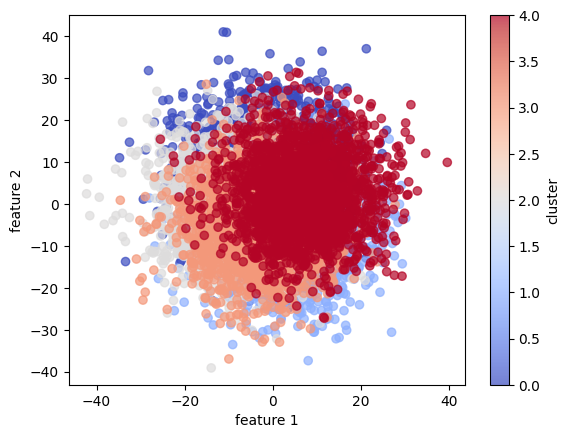

In [6]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

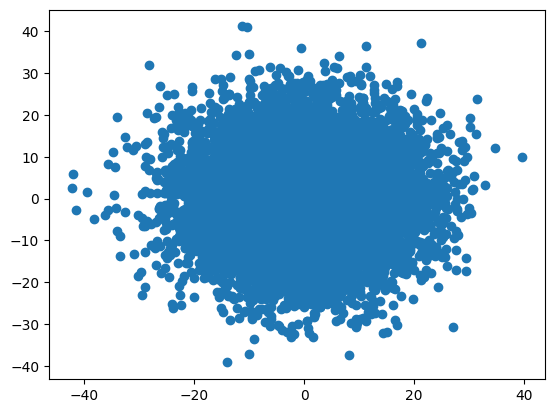

In [7]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [8]:
corr_dataset = pd.DataFrame(X) 

In [9]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [10]:
corr_dataset['target'] = y

In [11]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,2.198493,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,13.468418,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,5.684891,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,17.961972,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,-0.980331,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,22.337013,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,16.047145,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,20.945765,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,2.576347,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4


In [12]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [13]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,-0.007930,0.017956,-0.241750,0.061234,-0.042451,0.141158,-0.026518,0.126860,-0.031739,-0.171760,-0.060806,-0.060898,-0.030378,0.123199,-0.056135,0.102769,0.063902,0.021977,-0.037463
vab_2,-0.007930,1.000000,0.052005,0.042598,-0.097748,-0.206858,0.014471,0.096988,0.120888,0.097736,-0.238121,0.300179,0.274683,-0.255581,-0.237771,-0.219315,-0.055380,0.203516,-0.089351,-0.018417
vab_3,0.017956,0.052005,1.000000,-0.082809,-0.043360,-0.122994,-0.127742,0.157456,-0.147446,0.295336,-0.133064,-0.050656,-0.140855,-0.125184,-0.110303,-0.160540,0.188784,0.018144,0.108266,-0.052346
vab_4,-0.241750,0.042598,-0.082809,1.000000,-0.044830,0.043578,-0.136867,0.011336,-0.059983,-0.051283,0.163128,0.116957,0.140627,0.022603,-0.128366,0.062057,-0.155399,-0.019579,-0.023285,0.071143
vab_5,0.061234,-0.097748,-0.043360,-0.044830,1.000000,0.092679,0.013924,-0.039188,0.006797,-0.082151,0.043953,-0.092325,-0.082927,0.087854,0.089236,0.066920,-0.008563,-0.057374,0.052305,0.010066
vab_6,-0.042451,-0.206858,-0.122994,0.043578,0.092679,1.000000,-0.025954,-0.095857,-0.068621,-0.129966,0.242819,-0.171812,-0.153994,0.217946,0.140048,0.206508,-0.028595,-0.149474,0.052402,0.058976
vab_7,0.141158,0.014471,-0.127742,-0.136867,0.013924,-0.025954,1.000000,-0.069539,0.155710,-0.063904,-0.051850,0.041215,0.105934,0.011853,0.111185,0.016967,0.008212,0.034464,-0.151806,-0.032267
vab_8,-0.026518,0.096988,0.157456,0.011336,-0.039188,-0.095857,-0.069539,1.000000,-0.068633,0.169496,-0.090759,0.047685,0.011687,-0.110777,-0.104682,-0.108088,0.072723,0.055636,0.012831,-0.027005
vab_9,0.126860,0.120888,-0.147446,-0.059983,0.006797,-0.068621,0.155710,-0.068633,1.000000,-0.180334,-0.166829,0.165153,0.207472,-0.074239,0.005238,-0.065449,-0.111970,0.130969,-0.090134,0.019691
vab_10,-0.031739,0.097736,0.295336,-0.051283,-0.082151,-0.129966,-0.063904,0.169496,-0.180334,1.000000,-0.092061,0.006423,-0.073259,-0.130197,-0.148117,-0.132405,0.209608,0.033134,-0.012655,-0.114037


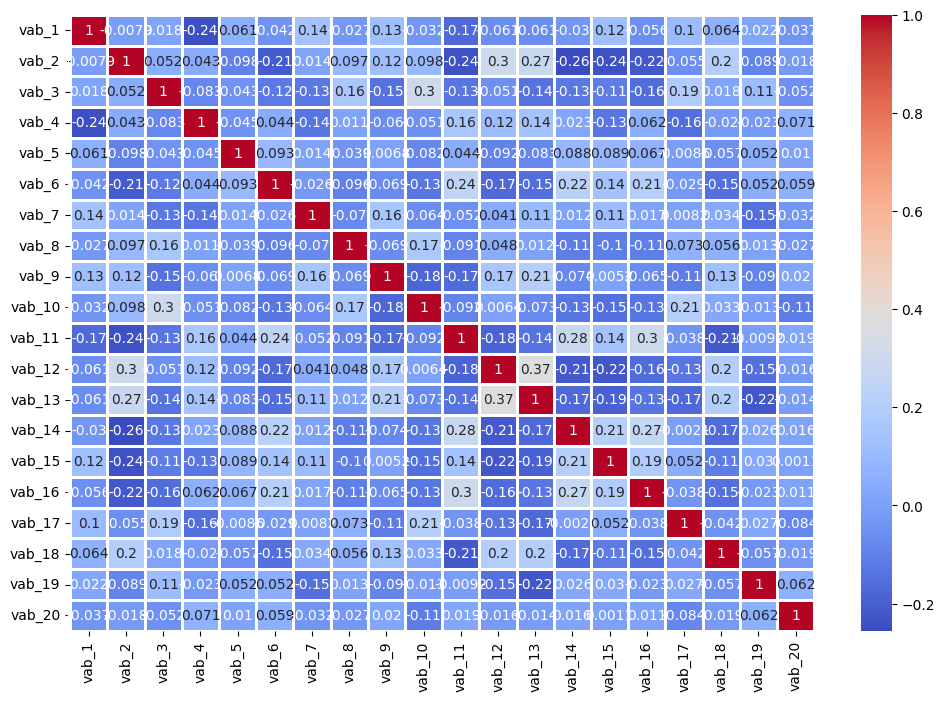

In [14]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='coolwarm',annot=True,linewidths=1)
plt.show()

## data standardization

In [15]:
X_values = corr_dataset.iloc[:,:-1].values

In [16]:
y_values = corr_dataset.iloc[:,-1].values

In [17]:
scaler = StandardScaler()

In [18]:
X_values = scaler.fit_transform(X_values)

In [19]:
np.mean(X_values),np.std(X_values)

(7.247535904753022e-17, 1.0000000000000002)

In [20]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,1.282796,0.635954,-0.463143,-0.901185,-0.746561,-2.081862,-0.065090,0.597602,0.131371,-0.066492,-1.546173,0.070868,0.686991,-0.722060,-1.252690,-2.060682,0.338710,-0.053899,0.340403,0.337050
1,-0.243911,0.384225,1.052897,0.719121,-0.162152,-0.895530,0.159094,-0.269085,0.290744,0.499972,-0.070245,1.083314,0.216820,0.051804,-0.193952,-1.951442,0.114589,0.958178,1.187149,1.088807
2,-0.170218,0.274017,0.177100,0.544666,-0.275880,-0.180854,0.408321,0.642351,0.167967,-0.129696,-2.950248,0.384073,0.379774,-1.698486,-0.223780,-1.462184,-0.322176,0.177215,1.656789,1.621064
3,0.395473,0.709759,0.837201,0.304592,0.473759,0.030813,0.278791,0.820429,0.408467,1.180179,1.022376,1.486998,-0.369022,-0.903779,-1.202737,-0.817284,-0.170211,0.315762,0.833724,-0.071043
4,0.614402,0.573545,-0.026349,0.244823,-0.763054,0.179519,0.215140,1.635959,-0.792371,-0.897346,0.498601,-0.214705,1.093639,-0.293714,-0.831851,-1.086395,-1.094448,1.662480,0.875991,2.747269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-1.086836,-1.099767,-0.075061,-2.556288,-0.164677,-0.609565,0.656699,-0.336682,0.824814,0.140679,-2.519717,1.880035,0.268130,0.247299,-0.704559,-1.765763,1.540413,1.899876,-1.826644,-0.223829
9996,0.545987,0.840610,0.541955,-1.491443,0.520983,-0.186488,0.612972,-1.440854,1.542706,-0.637982,-0.809842,1.314977,0.974235,1.221589,-0.959477,-1.285322,-1.202776,-0.103540,-2.149936,0.404500
9997,-0.168457,-0.909972,0.101777,-1.414209,0.774463,-0.373896,-0.238983,-0.186281,0.234331,-0.478931,-0.569263,1.755050,0.444931,0.482848,1.049967,-1.522296,1.212498,-0.017348,-0.954609,-1.279043
9998,0.162048,-0.804683,-0.125700,-0.631830,0.311490,0.539074,0.822340,-1.815911,0.532062,-0.753069,-0.327373,0.104813,-0.537997,0.773269,0.920524,1.125856,-0.629272,0.663315,-2.072471,-1.018535


<Axes: ylabel='Density'>

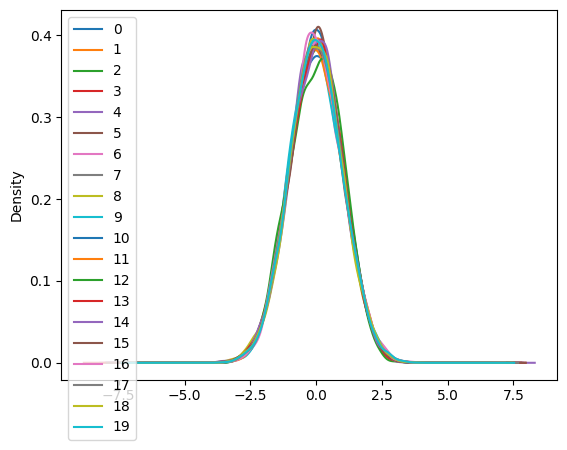

In [21]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [22]:
pca_general = PCA()

In [23]:
pca_general.fit(X_values)

PCA()

In [24]:
explained_variance = pca_general.explained_variance_ratio_

In [25]:
explained_variance

array([0.14369398, 0.10111529, 0.08425184, 0.06041206, 0.04802355,
       0.04600411, 0.04420642, 0.04217369, 0.04043458, 0.03916113,
       0.03840297, 0.03769475, 0.03749548, 0.03641461, 0.03596939,
       0.03570649, 0.0339509 , 0.03295621, 0.03201053, 0.02992204])

In [26]:
eigenvalues = pca_general.explained_variance_

In [27]:
pd.DataFrame(eigenvalues)

,0
0,2.874167
1,2.022508
2,1.685205
3,1.208362
4,0.960567
5,0.920174
6,0.884217
7,0.843558
8,0.808772
9,0.783301


In [28]:
eigenvectors = pca_general.components_

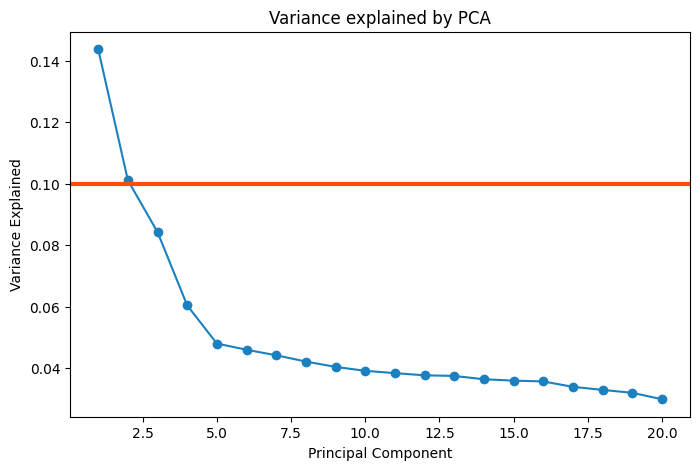

In [29]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [30]:
pca = PCA(n_components=4)

In [31]:
principal_components = pca.fit_transform(X_values)

In [32]:
pd.DataFrame(principal_components).head(8)

,0,1,2,3
0,2.903788,0.899415,1.147482,0.939648
1,1.784639,0.540394,-0.484197,1.339513
2,2.426160,0.520783,0.220058,2.702335
3,1.570365,0.836674,-0.726021,0.333975
4,1.294050,-0.593884,-0.861632,2.162399
5,1.877460,0.164349,-0.023288,-0.258108
6,1.298808,-0.664661,-0.135745,0.641883
7,0.682733,1.536436,-1.767673,0.217872


In [33]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2','principal component 3','principal component 4'])

In [34]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [35]:
final_df

,principal component 1,principal component 2,principal component 3,principal component 4,target
0,2.903788,0.899415,1.147482,0.939648,0
1,1.784639,0.540394,-0.484197,1.339513,0
2,2.426160,0.520783,0.220058,2.702335,0
3,1.570365,0.836674,-0.726021,0.333975,0
4,1.294050,-0.593884,-0.861632,2.162399,0
...,...,...,...,...,...
9995,2.751559,0.288210,2.131660,-0.989650,4
9996,1.822147,-1.926145,1.605699,-0.189484,4
9997,0.663328,0.177557,1.507092,-0.948001,4
9998,-1.159880,-1.653202,1.704553,-1.464450,4


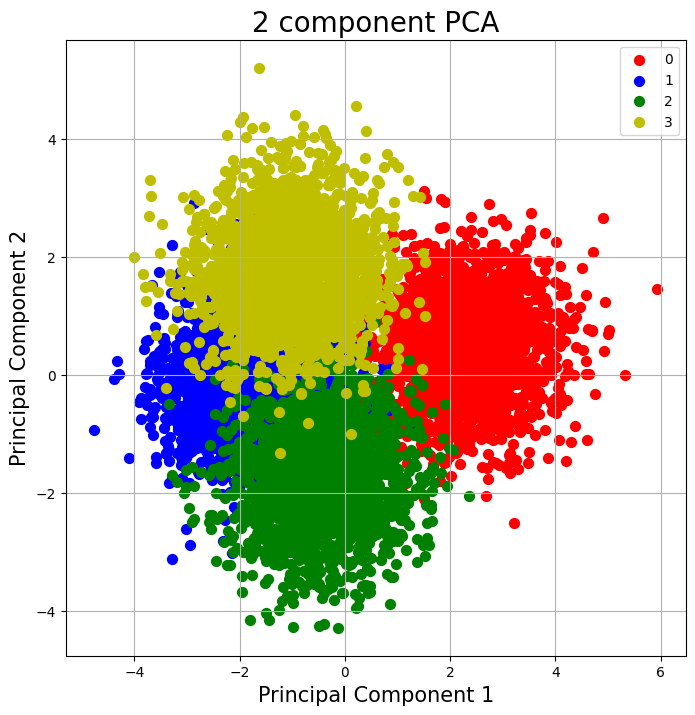

In [36]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

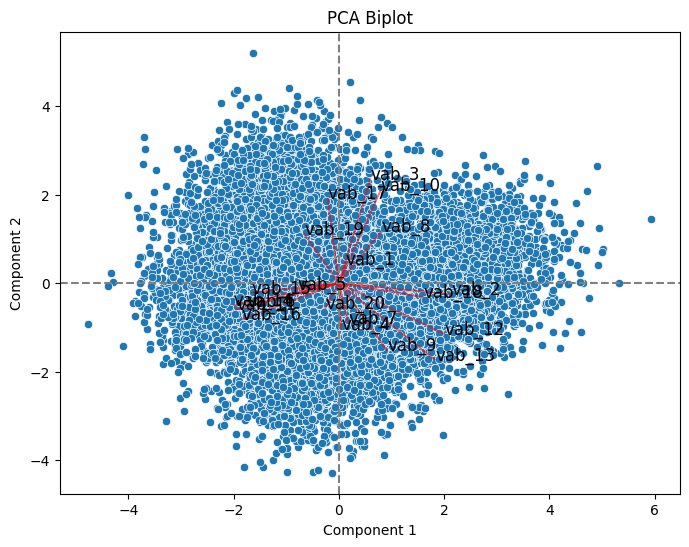

In [37]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

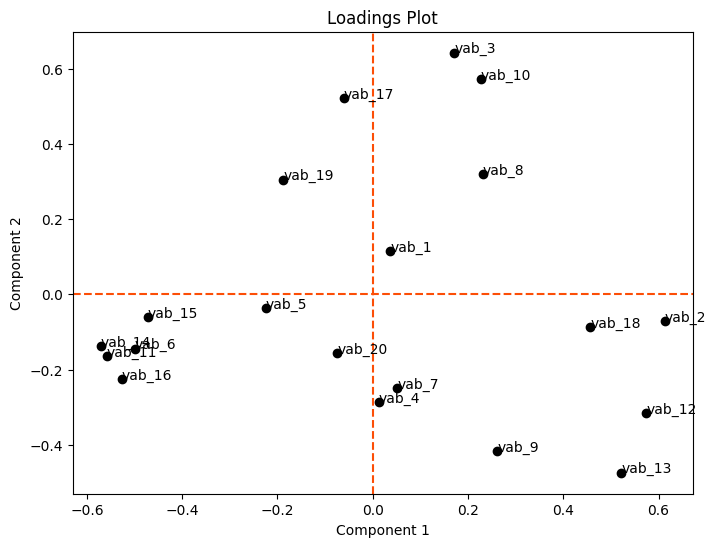

In [38]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [39]:
X_pca = pca.transform(X_values)

In [40]:
pd.DataFrame(X_pca).head()

,0,1,2,3
0,2.903788,0.899415,1.147482,0.939648
1,1.784639,0.540394,-0.484197,1.339513
2,2.426160,0.520783,0.220058,2.702335
3,1.570365,0.836674,-0.726021,0.333975
4,1.294050,-0.593884,-0.861632,2.162399


## t-SNE

In [41]:
tsne = TSNE(n_components=3,random_state=42)

In [42]:
X_tsne = tsne.fit_transform(X_values)

In [43]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [44]:
tsne_data

,dim_1,dim_2,dim_3,target
0,31.842695,-5.214681,-15.629435,0
1,41.830608,14.632259,-22.139194,0
2,44.244728,27.010977,6.321259,0
3,47.051899,-1.478124,11.137963,0
4,27.997765,12.853975,-15.795429,0
...,...,...,...,...
9995,24.950605,-15.895247,14.398179,4
9996,15.550078,21.909937,-15.427444,4
9997,11.032269,-12.711702,33.746712,4
9998,8.597681,-15.046994,12.893493,4


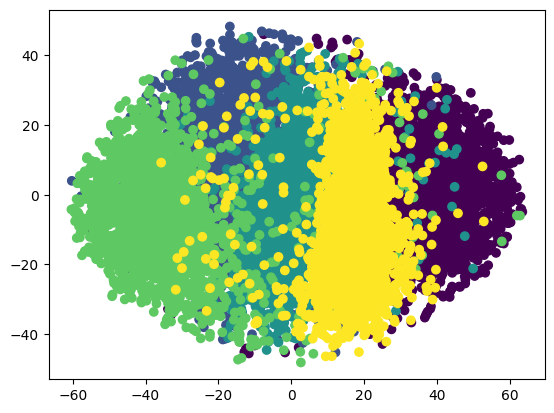

In [45]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [46]:
tsne.kl_divergence_

3.463376760482788

## umap

In [47]:
umap = umap.UMAP(n_components=3,random_state=42)

In [48]:
X_umap = umap.fit_transform(X_values)

In [49]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [50]:
umap_data

,dim_1,dim_2,dim_3,target
0,4.956539,4.970428,1.832499,0
1,5.418328,4.567362,1.598837,0
2,5.636513,4.508578,1.424678,0
3,5.287605,3.905139,1.871153,0
4,5.446301,4.936316,1.525476,0
...,...,...,...,...
9995,3.971137,5.906528,3.436524,4
9996,4.307928,6.066150,4.437188,4
9997,4.367432,5.796840,3.783244,4
9998,4.782877,5.871664,4.843281,4


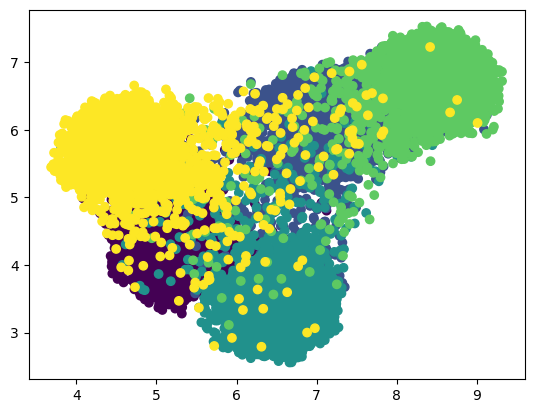

In [51]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [52]:
kmeans = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [53]:
kmeans.fit(X_values)

KMeans(n_clusters=5, random_state=42)

In [54]:
df_kmeans = corr_dataset.copy()

In [55]:
df_kmeans['k_means'] = kmeans.labels_

In [56]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,1
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,1


In [57]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.01
accuracy after: 0.9172


In [58]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


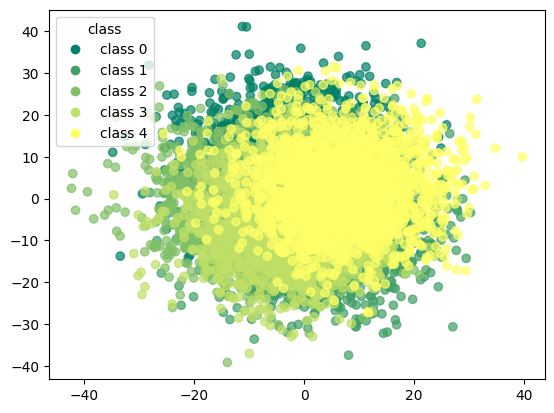

In [59]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

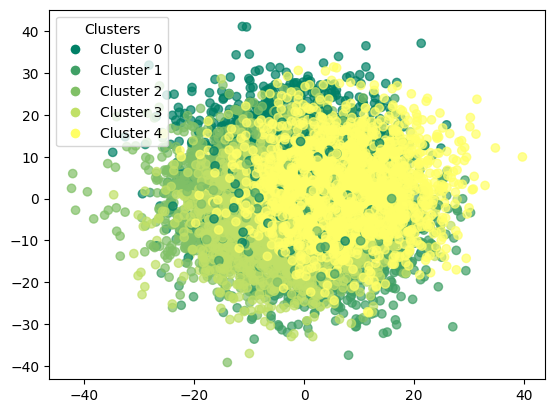

In [60]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [61]:
kmeans.cluster_centers_

array([[ 0.30366768, -0.66284741, -0.30134135, -0.21265493,  0.39172623,
         0.56807437, -0.15458529, -0.35992069,  0.10255349, -0.78696959,
         0.1770791 , -0.72062564, -0.76571668,  0.49178677,  0.63652687,
         0.33938791, -0.16534422, -0.34621854,  0.75695697,  0.42070798],
       [ 0.76167505,  0.27275561, -0.18987972, -0.76499192,  0.04494659,
        -0.35991848,  0.89799453, -0.08727849,  0.67818321, -0.02315007,
        -0.62062916,  0.2688945 ,  0.41504621, -0.21713234,  0.25879123,
        -0.23026334,  0.21970029,  0.40224215, -0.59978727, -0.34035916],
       [-0.18794484,  0.84440328,  0.53091562,  0.31131168, -0.30506144,
        -0.64675653, -0.4877565 ,  0.44367394,  0.0908189 ,  0.38602596,
        -0.82671621,  0.73382945,  0.52016797, -0.91112148, -0.90251651,
        -0.86999658, -0.1859313 ,  0.52551037,  0.2452459 ,  0.12749529],
       [-0.71179414, -0.0184098 , -0.76360857,  0.84463369, -0.08818746,
         0.32641883,  0.05037893, -0.29420126,  

In [62]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1867    4   25   24   80]
 [   7 1770   73  112   38]
 [  22   69 1852   16   41]
 [  20   95   15 1852   18]
 [  72   49   27   21 1831]]


In [63]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.94      0.93      0.94      2000
           1       0.89      0.89      0.89      2000
           2       0.93      0.93      0.93      2000
           3       0.91      0.93      0.92      2000
           4       0.91      0.92      0.91      2000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



### k-means with pca

In [64]:
kmeans_pca = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [65]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=5, random_state=42)

In [66]:
df_pca_kmeans = corr_dataset.copy()

In [67]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [68]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,1
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,1


In [69]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.1931
accuracy after: 0.9106


In [70]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


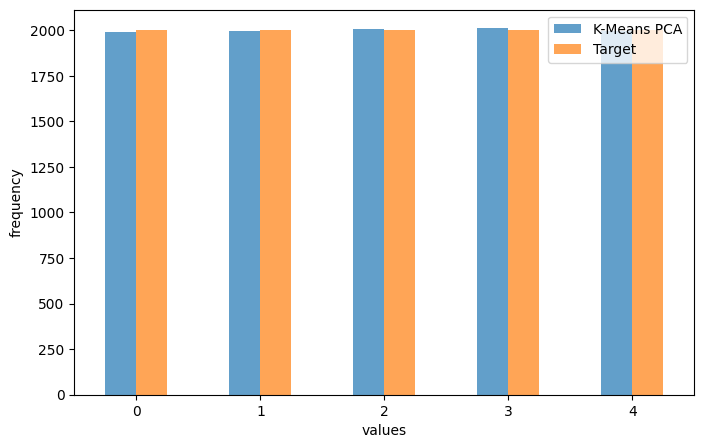

In [71]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [72]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1863    4   27   24   82]
 [   7 1752   83  118   40]
 [  23   76 1847   13   41]
 [  20  110   17 1833   20]
 [  79   55   31   24 1811]]


In [73]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.94      0.93      0.93      2000
           1       0.88      0.88      0.88      2000
           2       0.92      0.92      0.92      2000
           3       0.91      0.92      0.91      2000
           4       0.91      0.91      0.91      2000

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



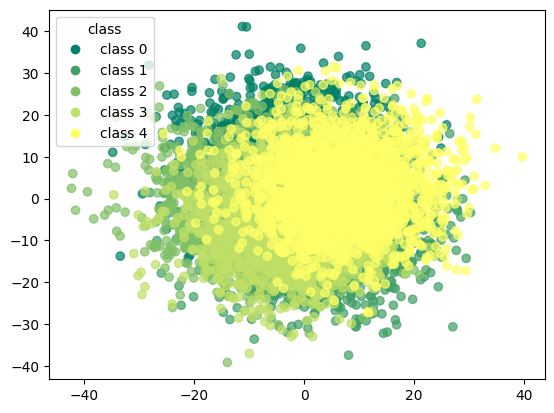

In [74]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

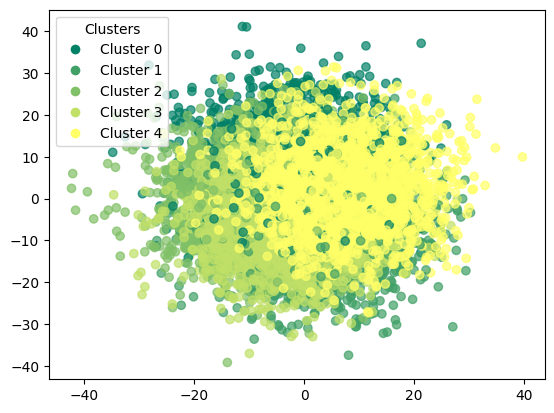

In [75]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

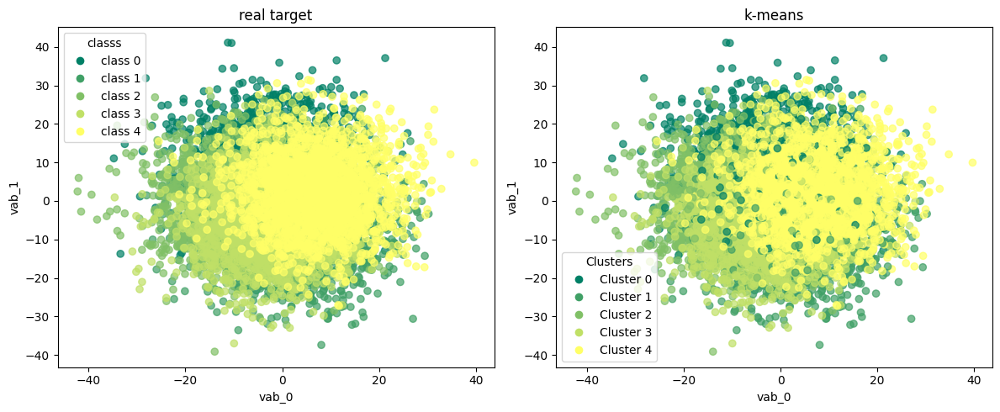

In [76]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

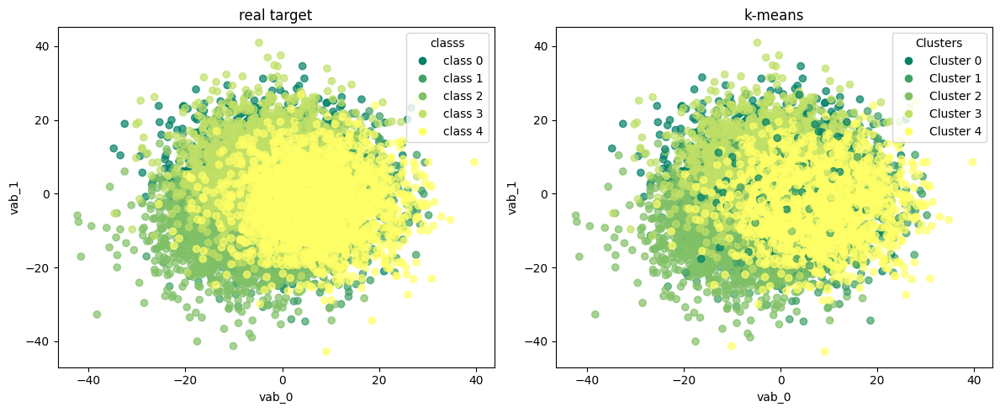

In [77]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

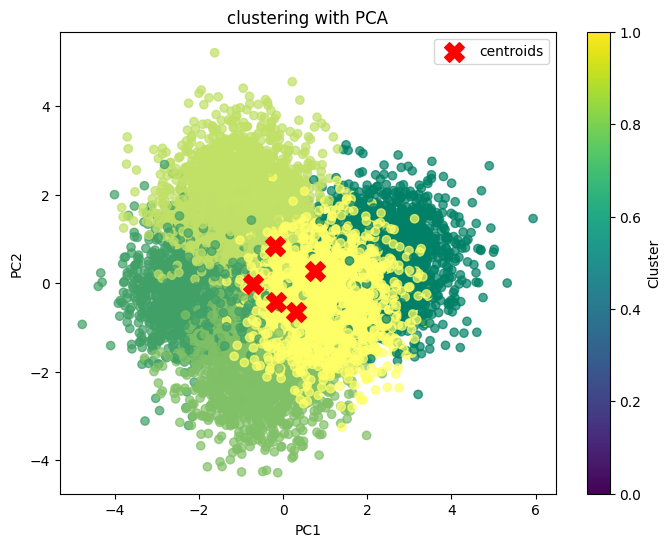

In [78]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

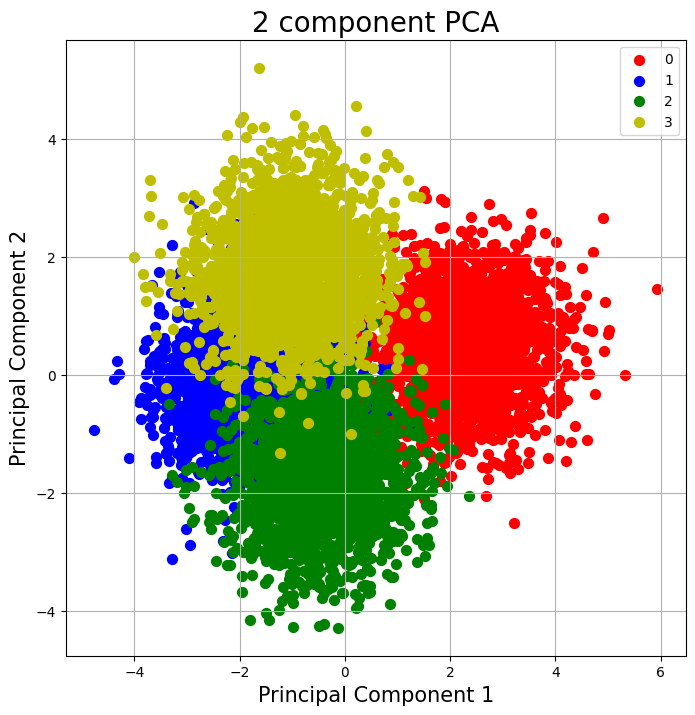

In [79]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [80]:
kmeans_tsne = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [81]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=5, random_state=42)

In [82]:
df_tsne_kmeans = corr_dataset.copy()

In [83]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [84]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


In [85]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.385
accuracy after: 0.6239


In [86]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,2
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,2
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,2


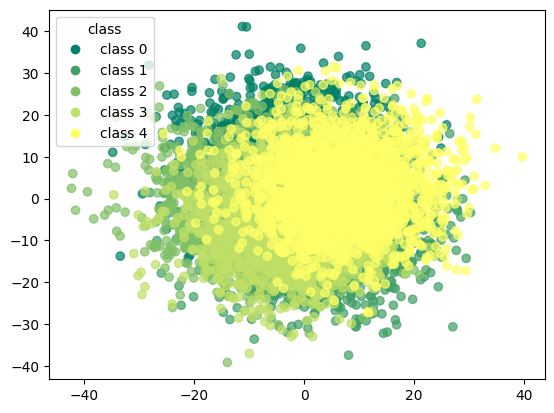

In [87]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

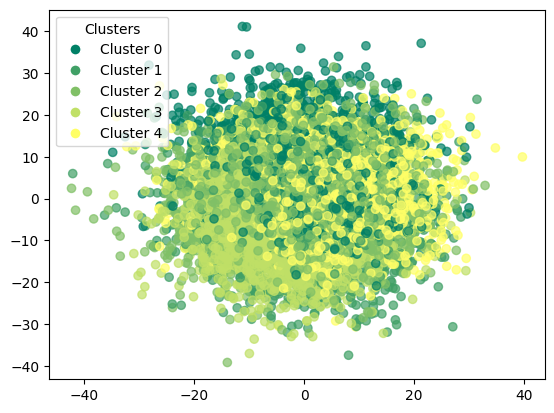

In [88]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

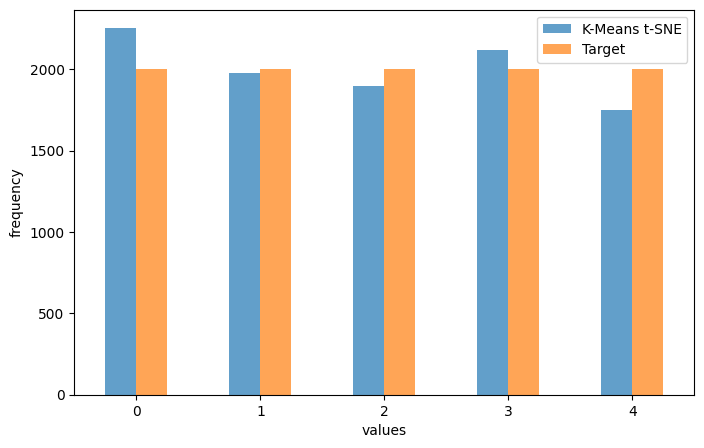

In [89]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [90]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1821   41   73   12   53]
 [   6 1239  112  346  297]
 [  25  513  787   30  645]
 [  25   70  111 1716   78]
 [ 376  116  817   15  676]]


In [91]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.81      0.91      0.86      2000
           1       0.63      0.62      0.62      2000
           2       0.41      0.39      0.40      2000
           3       0.81      0.86      0.83      2000
           4       0.39      0.34      0.36      2000

    accuracy                           0.62     10000
   macro avg       0.61      0.62      0.62     10000
weighted avg       0.61      0.62      0.62     10000



### k-means with umap

In [92]:
kmeans_umap = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [93]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=5, random_state=42)

In [94]:
df_umap_kmeans = corr_dataset.copy()

In [95]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [96]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,1
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,1


In [97]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.1903
accuracy after: 0.8929


In [98]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


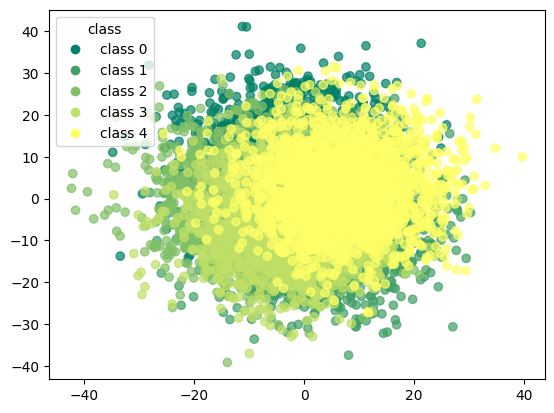

In [99]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

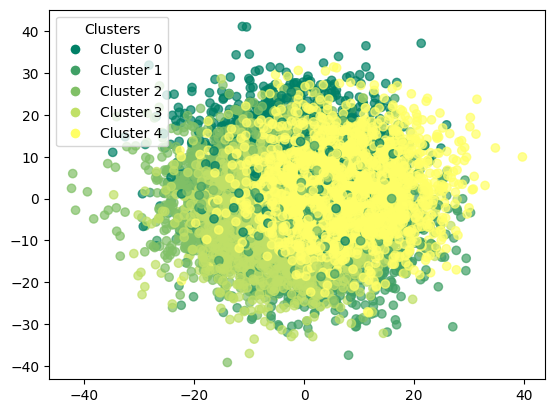

In [100]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

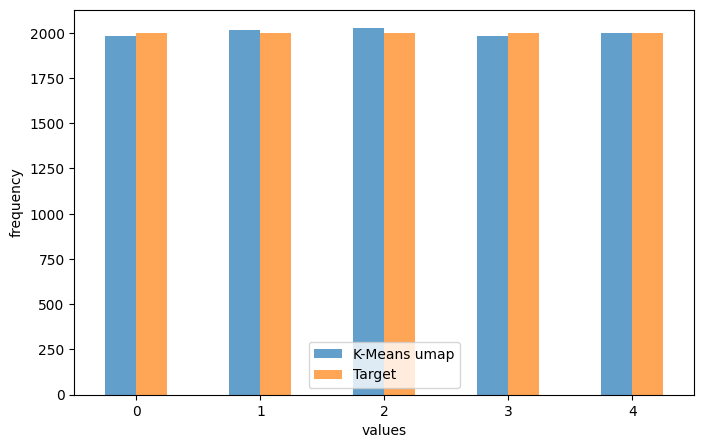

In [101]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [102]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1830    5   29   27  109]
 [   4 1718  109  127   42]
 [  28   78 1826   15   53]
 [  25  134   24 1790   27]
 [  94   81   38   22 1765]]


In [103]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      2000
           1       0.85      0.86      0.86      2000
           2       0.90      0.91      0.91      2000
           3       0.90      0.90      0.90      2000
           4       0.88      0.88      0.88      2000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



## trimmed k-means

In [104]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [105]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=5,trim_fraction=0.1)

In [106]:
trimmed_kmeans

KMeans(n_clusters=5, random_state=42)

In [107]:
df_trim_kmeans = corr_dataset.copy()

In [108]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [109]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [110]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,4.222692,-4.099904,-2.485304,-7.897088,-2.038427,-4.658264,24.086242,-7.833442,-0.161151,-6.175265,...,-6.494496,18.015568,10.096452,-14.284175,16.469863,-15.575399,-6.876458,-5.262828,4,1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,1
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,1


In [111]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.193
accuracy after: 0.9197777777777778


In [112]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,4.222692,-4.099904,-2.485304,-7.897088,-2.038427,-4.658264,24.086242,-7.833442,-0.161151,-6.175265,...,-6.494496,18.015568,10.096452,-14.284175,16.469863,-15.575399,-6.876458,-5.262828,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


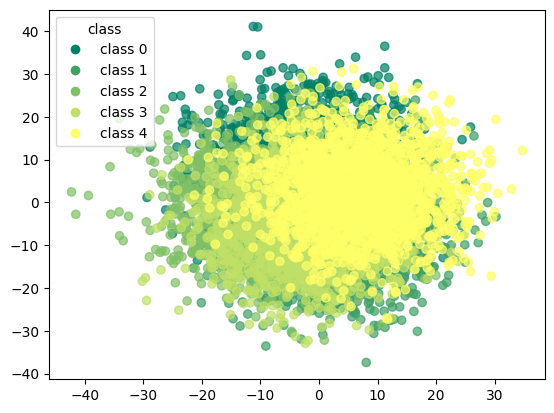

In [113]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

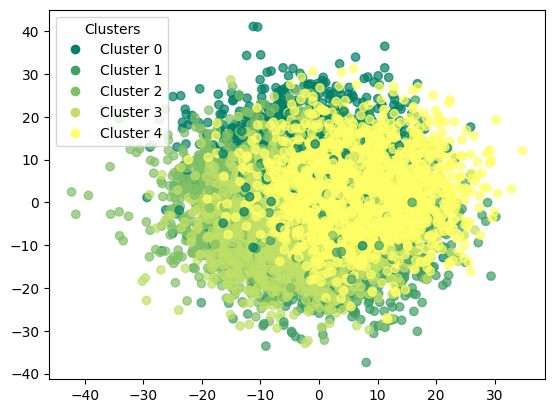

In [114]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [115]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1686    3   22   20   72]
 [   6 1590   71   99   31]
 [  17   62 1683   12   30]
 [  17   81   14 1661   16]
 [  67   43   25   14 1658]]


In [116]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1803
           1       0.89      0.88      0.89      1797
           2       0.93      0.93      0.93      1804
           3       0.92      0.93      0.92      1789
           4       0.92      0.92      0.92      1807

    accuracy                           0.92      9000
   macro avg       0.92      0.92      0.92      9000
weighted avg       0.92      0.92      0.92      9000



### trimmed k-means with pca

In [117]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=5,trim_fraction=0.1)

In [118]:
trim_kmeans_pca

KMeans(n_clusters=5, random_state=42)

In [119]:
df_pca_trim_kmeans = corr_dataset.copy()

In [120]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [121]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [122]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,4.222692,-4.099904,-2.485304,-7.897088,-2.038427,-4.658264,24.086242,-7.833442,-0.161151,-6.175265,...,-6.494496,18.015568,10.096452,-14.284175,16.469863,-15.575399,-6.876458,-5.262828,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


In [123]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.19922222222222222
accuracy after: 0.9121111111111111


In [124]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,4.222692,-4.099904,-2.485304,-7.897088,-2.038427,-4.658264,24.086242,-7.833442,-0.161151,-6.175265,...,-6.494496,18.015568,10.096452,-14.284175,16.469863,-15.575399,-6.876458,-5.262828,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


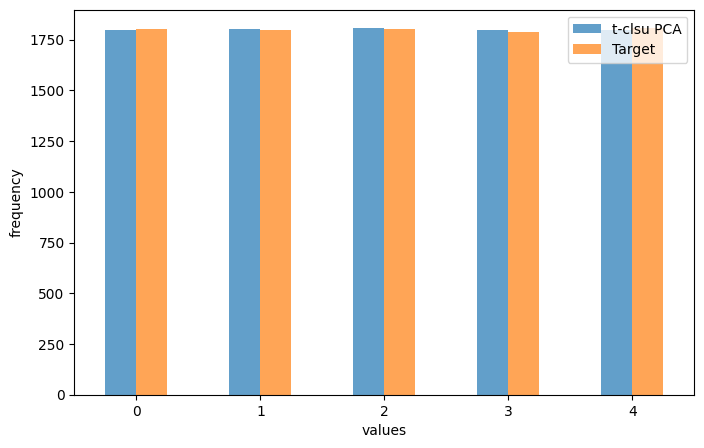

In [125]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [126]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1687    8   22   18   68]
 [   5 1573   80  105   34]
 [  20   71 1665   11   37]
 [  16  100   17 1641   15]
 [  71   49   23   21 1643]]


In [127]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1803
           1       0.87      0.88      0.87      1797
           2       0.92      0.92      0.92      1804
           3       0.91      0.92      0.92      1789
           4       0.91      0.91      0.91      1807

    accuracy                           0.91      9000
   macro avg       0.91      0.91      0.91      9000
weighted avg       0.91      0.91      0.91      9000



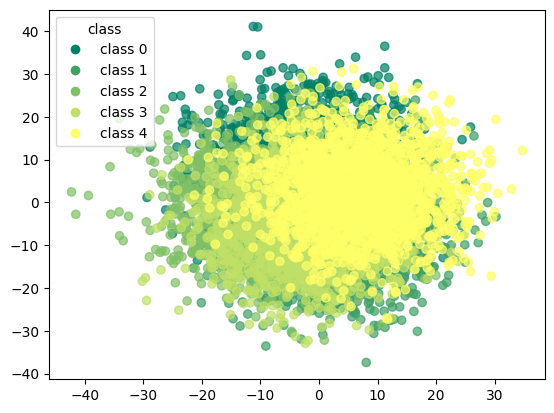

In [128]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

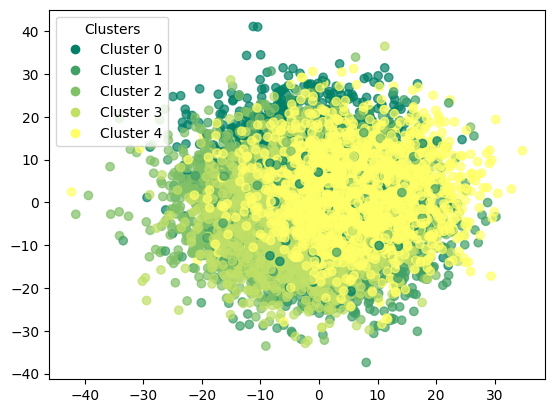

In [129]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

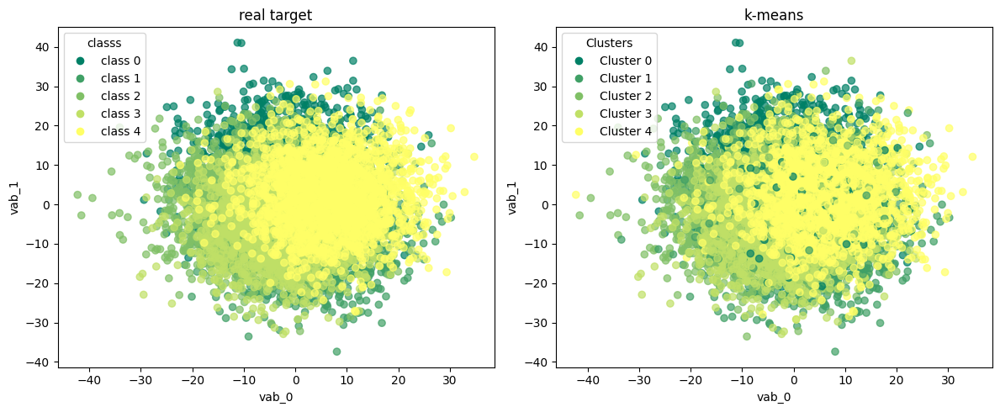

In [130]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

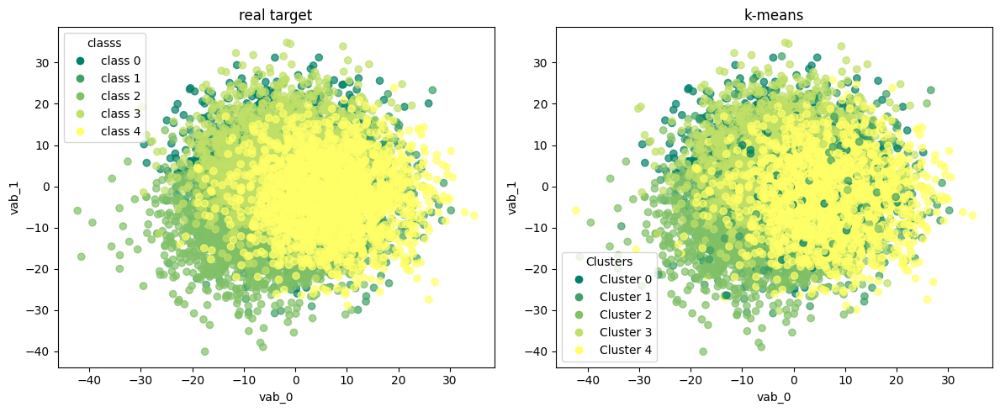

In [131]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [132]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=5,trim_fraction=0.1)

In [133]:
trim_kmeans_tsne

KMeans(n_clusters=5, random_state=42)

In [134]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [135]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [136]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [137]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,4.222692,-4.099904,-2.485304,-7.897088,-2.038427,-4.658264,24.086242,-7.833442,-0.161151,-6.175265,...,-6.494496,18.015568,10.096452,-14.284175,16.469863,-15.575399,-6.876458,-5.262828,4,1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,0
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,3
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,0


In [138]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.04411111111111111
accuracy after: 0.6353333333333333


In [139]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,4.222692,-4.099904,-2.485304,-7.897088,-2.038427,-4.658264,24.086242,-7.833442,-0.161151,-6.175265,...,-6.494496,18.015568,10.096452,-14.284175,16.469863,-15.575399,-6.876458,-5.262828,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,2
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,1
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,2


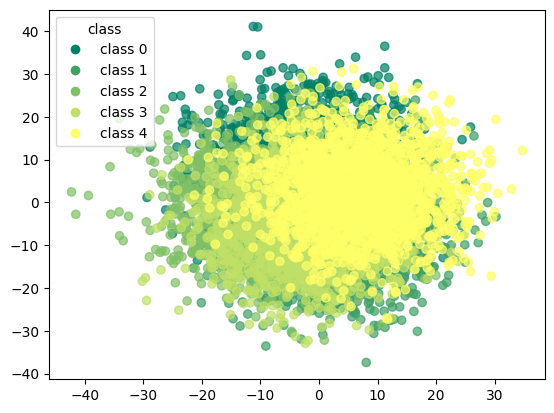

In [140]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

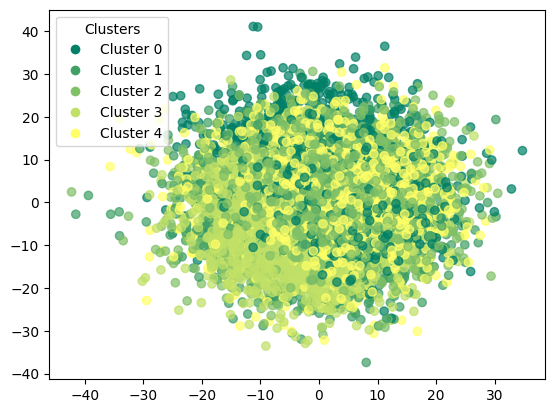

In [141]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

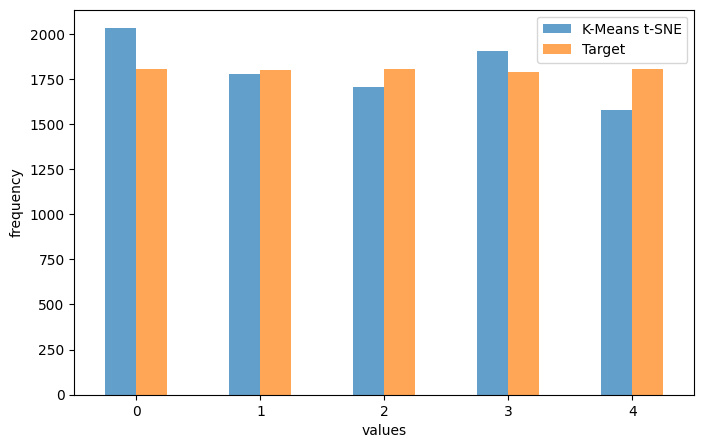

In [142]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [143]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[1667   35   45   15   41]
 [   3 1158  102  289  245]
 [  19  458  719   22  586]
 [  19   54   96 1544   76]
 [ 324   75  744   34  630]]


In [144]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.82      0.92      0.87      1803
           1       0.65      0.64      0.65      1797
           2       0.42      0.40      0.41      1804
           3       0.81      0.86      0.84      1789
           4       0.40      0.35      0.37      1807

    accuracy                           0.64      9000
   macro avg       0.62      0.64      0.63      9000
weighted avg       0.62      0.64      0.63      9000



### trimmed k-means with umap

In [145]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=5,trim_fraction=0.1)

In [146]:
trim_kmeans_umap

KMeans(n_clusters=5, random_state=42)

In [147]:
df_umap_trim_kmeans = corr_dataset.copy()

In [148]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [149]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [150]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,1
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,1


In [151]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.006666666666666667
accuracy after: 0.9353333333333333


In [152]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


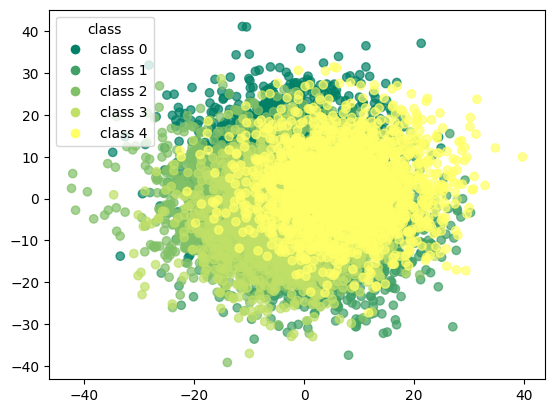

In [153]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

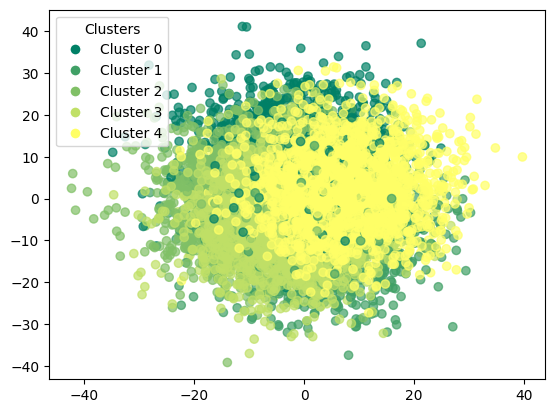

In [154]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

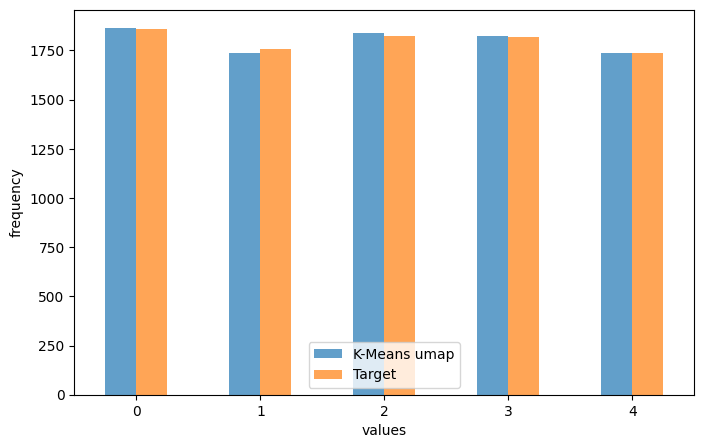

In [155]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [156]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[1770    3   13   15   60]
 [   2 1582   63   87   22]
 [  18   44 1736    5   21]
 [  16   79    8 1707   11]
 [  58   30   18    9 1623]]


In [157]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1861
           1       0.91      0.90      0.91      1756
           2       0.94      0.95      0.95      1824
           3       0.94      0.94      0.94      1821
           4       0.93      0.93      0.93      1738

    accuracy                           0.94      9000
   macro avg       0.94      0.93      0.93      9000
weighted avg       0.94      0.94      0.94      9000



## dbscan

In [158]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

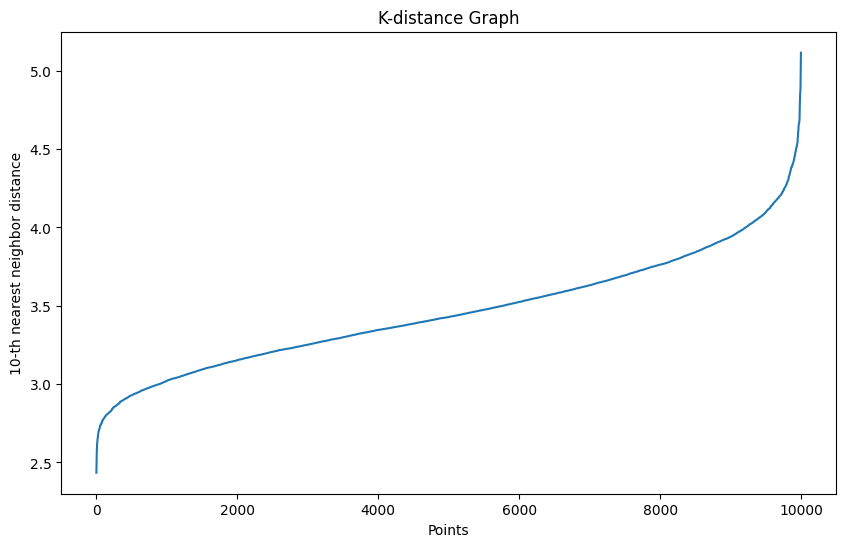

In [159]:
plot_k_distance_graph(X_values,k=10) 

In [160]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [161]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [162]:
df_dbscan = corr_dataset.copy()

In [163]:
df_dbscan['dbscan'] = dbscan.labels_

In [164]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [165]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,-1
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,-1
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,-1
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,-1
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,-1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,-1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,-1
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,-1


In [166]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    10000
Name: count, dtype: int64


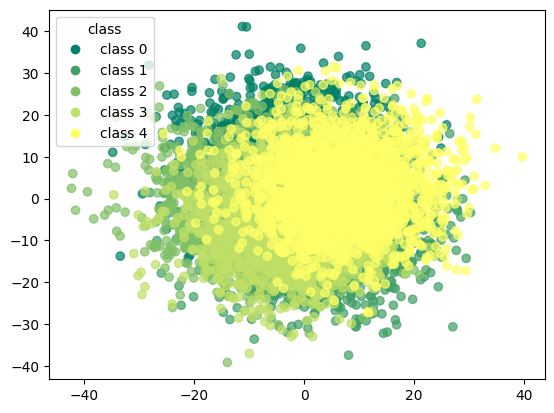

In [167]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

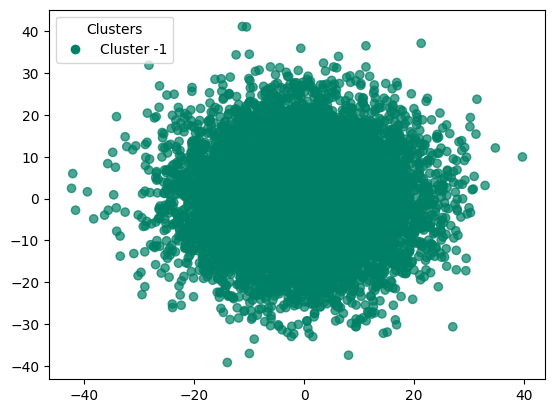

In [168]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [169]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]]


In [170]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    2000.0
           1       0.00      0.00      0.00    2000.0
           2       0.00      0.00      0.00    2000.0
           3       0.00      0.00      0.00    2000.0
           4       0.00      0.00      0.00    2000.0

    accuracy                           0.00   10000.0
   macro avg       0.00      0.00      0.00   10000.0
weighted avg       0.00      0.00      0.00   10000.0



### dbscan with pca

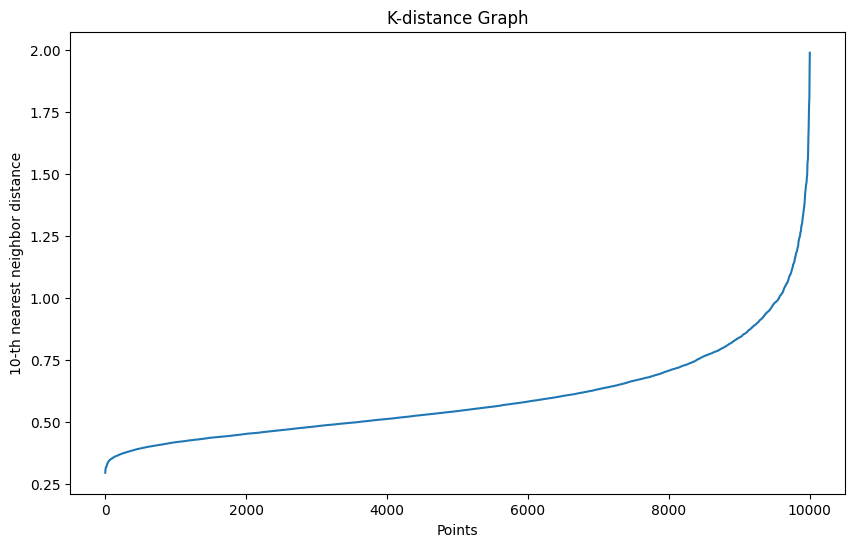

In [171]:
plot_k_distance_graph(X_pca,k=10)

In [172]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [173]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [174]:
df_pca_dbscan = corr_dataset.copy()

In [175]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [176]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.0304
accuracy after: 0.0031


In [177]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,-1
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,-1
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,-1
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,5
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,-1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,-1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,31
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,-1


In [178]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
-1     8079
 14     352
 5      309
 12     286
 17     277
 31     245
 1       39
 2       38
 34      24
 19      20
 32      17
 18      16
 3       16
 35      13
 26      13
 8       12
 38      11
 24      11
 39      11
 40      10
 23      10
 30      10
 29      10
 25      10
 37      10
 4       10
 15      10
 6       10
 33      10
 9       10
 16      10
 21       9
 28       9
 10       9
 41       9
 20       8
 7        8
 0        8
 27       7
 11       7
 13       7
 22       6
 36       4
Name: count, dtype: int64


In [179]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0 ...    0    0    0]
 [1601    8   23 ...    0    0    4]
 [1638    0    0 ...    0    0    0]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]


In [180]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.00      0.01      2000
           1       0.00      0.00      0.00      2000
           2       0.61      0.01      0.02      2000
           3       0.00      0.00      0.00      2000
           4       0.00      0.00      0.00      2000
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

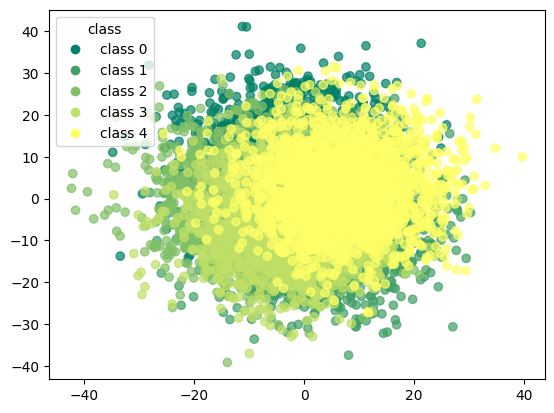

In [181]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

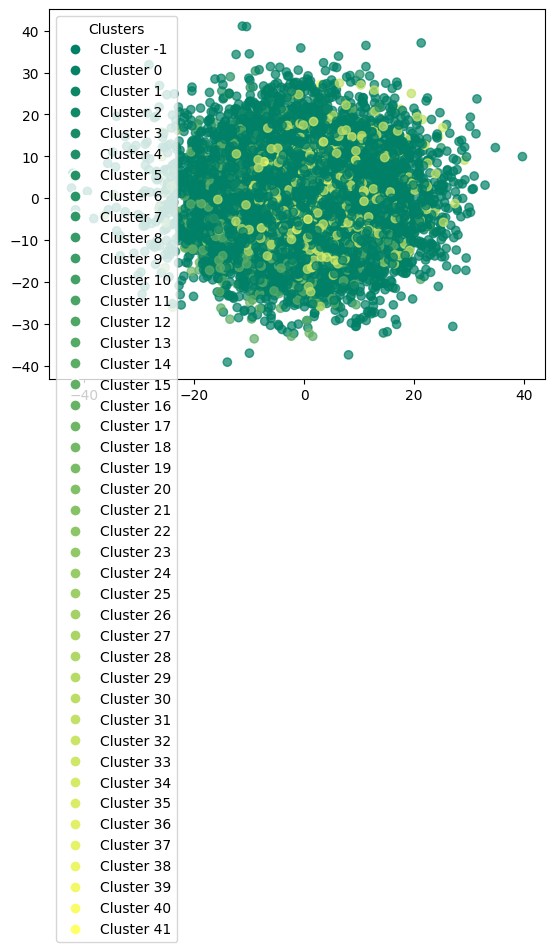

In [182]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

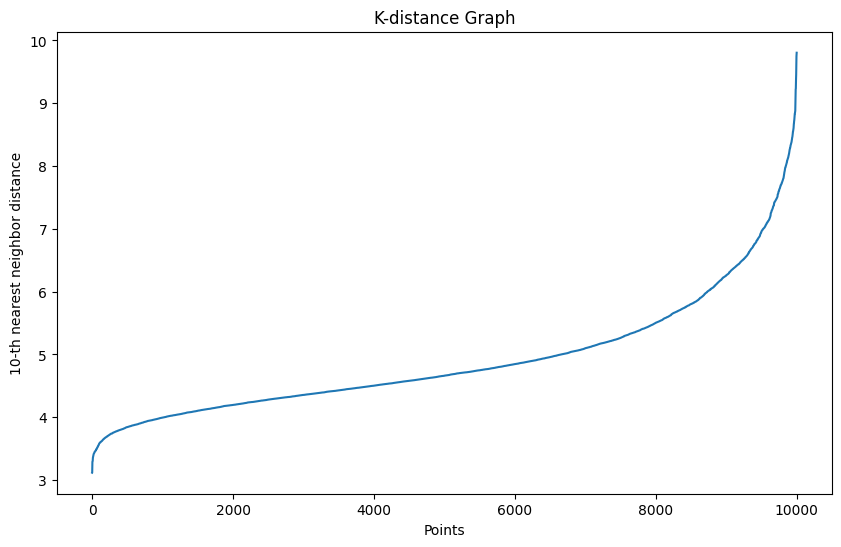

In [183]:
plot_k_distance_graph(X_tsne,k=10)

In [184]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [185]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [186]:
df_tsne_dbscan = corr_dataset.copy()

In [187]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [188]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [189]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,-1
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,-1
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,-1
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,-1
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,-1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,-1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,-1
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,-1


In [190]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
-1    10000
Name: count, dtype: int64


In [191]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]]


In [192]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    2000.0
           1       0.00      0.00      0.00    2000.0
           2       0.00      0.00      0.00    2000.0
           3       0.00      0.00      0.00    2000.0
           4       0.00      0.00      0.00    2000.0

    accuracy                           0.00   10000.0
   macro avg       0.00      0.00      0.00   10000.0
weighted avg       0.00      0.00      0.00   10000.0



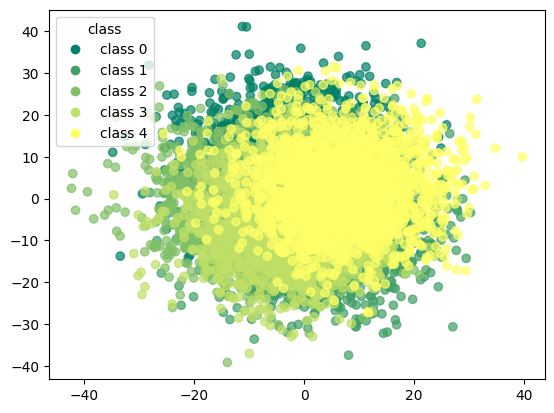

In [193]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

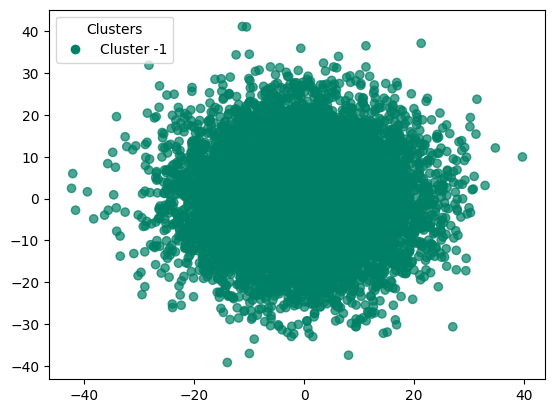

In [194]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

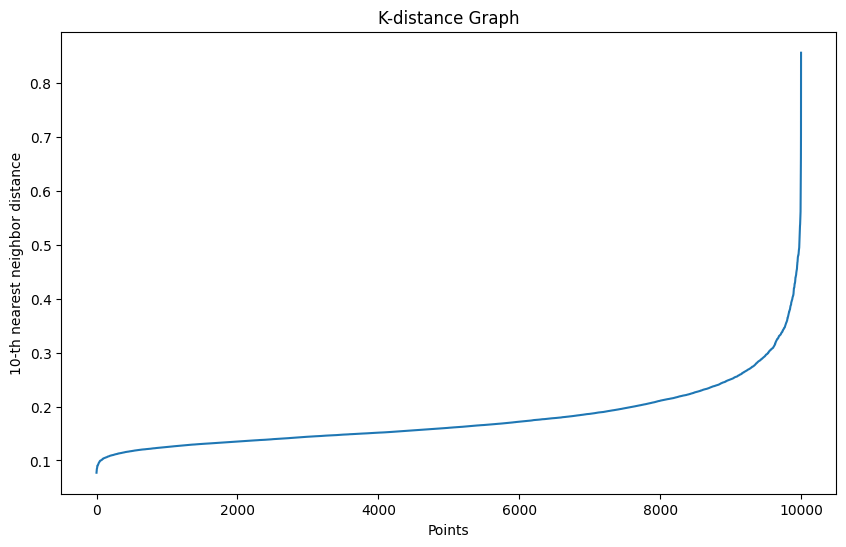

In [195]:
plot_k_distance_graph(X_umap,k=10)

In [196]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [197]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [198]:
df_umap_dbscan = corr_dataset.copy()

In [199]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [200]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 0.2
accuracy after: 0.2


In [201]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,4
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,4
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,4
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,4
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


In [202]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
 4    9999
-1       1
Name: count, dtype: int64


In [203]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[   0    0    0    0    0    0]
 [   0    0    0    0    0 2000]
 [   0    0    0    0    0 2000]
 [   0    0    0    0    0 2000]
 [   1    0    0    0    0 1999]
 [   0    0    0    0    0 2000]]


In [204]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      2000
           1       0.00      0.00      0.00      2000
           2       0.00      0.00      0.00      2000
           3       0.00      0.00      0.00      2000
           4       0.20      1.00      0.33      2000

    accuracy                           0.20     10000
   macro avg       0.03      0.17      0.06     10000
weighted avg       0.04      0.20      0.07     10000



## GMM - Gaussian Mixture Models

In [205]:
gmm = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [206]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [207]:
df_gmm = corr_dataset.copy()

In [208]:
df_gmm['gmm'] = gmm.predict(X_values)

In [209]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,1
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,1


In [210]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.2306
accuracy after: 0.6711


In [211]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


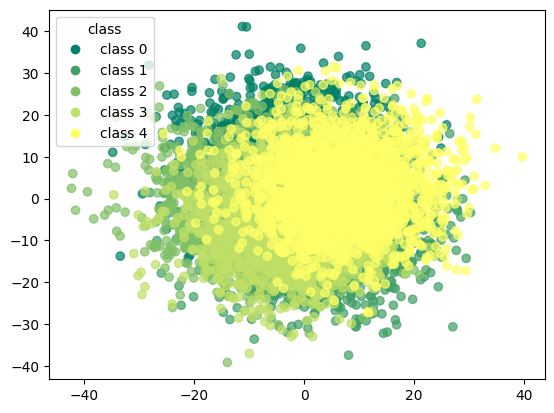

In [212]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

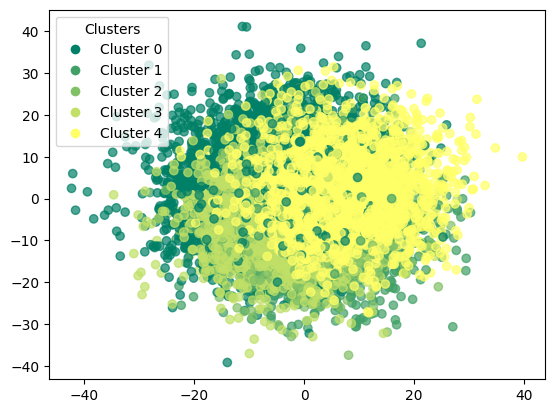

In [213]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [214]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1879    4    3   18   96]
 [  69 1524  289   78   40]
 [1873   66   24    6   31]
 [  55   50  378 1492   25]
 [ 149   36   12   11 1792]]


In [215]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.47      0.94      0.62      2000
           1       0.91      0.76      0.83      2000
           2       0.03      0.01      0.02      2000
           3       0.93      0.75      0.83      2000
           4       0.90      0.90      0.90      2000

    accuracy                           0.67     10000
   macro avg       0.65      0.67      0.64     10000
weighted avg       0.65      0.67      0.64     10000



### GMM with pca

In [216]:
gmm_pca = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [217]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [218]:
df_pca_gmm = corr_dataset.copy()

In [219]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [220]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,1
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,1


In [221]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.1974
accuracy after: 0.9081


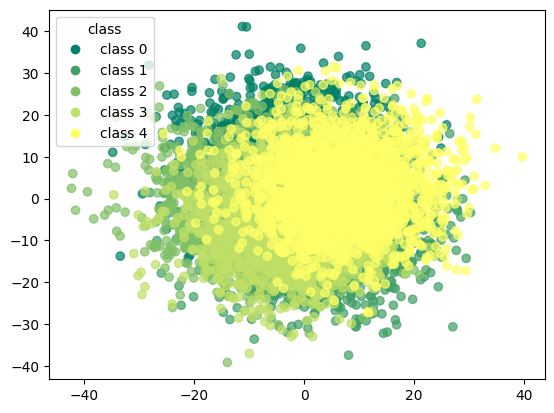

In [222]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

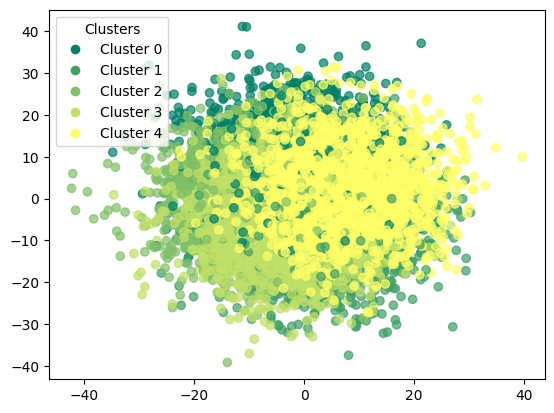

In [223]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [224]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1863    2   36   31   68]
 [   5 1706  103  148   38]
 [  20   66 1872   14   28]
 [  19   82   21 1863   15]
 [  87   57   51   28 1777]]


In [225]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      2000
           1       0.89      0.85      0.87      2000
           2       0.90      0.94      0.92      2000
           3       0.89      0.93      0.91      2000
           4       0.92      0.89      0.91      2000

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



### GMM with t-SNE

In [226]:
gmm_tsne = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [227]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [228]:
df_tsne_gmm = corr_dataset.copy()

In [229]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [230]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,1
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,4
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


In [231]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.2518
accuracy after: 0.4178


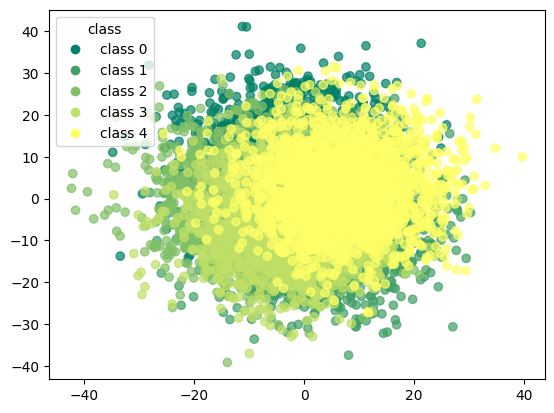

In [232]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

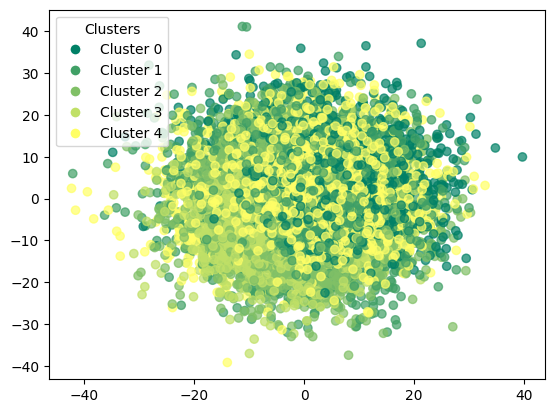

In [233]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [234]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[ 788  617   22    3  570]
 [  15  749 1064  111   61]
 [  20  535  914   17  514]
 [  17   38 1051  813   81]
 [ 506  419  151   10  914]]


In [235]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.59      0.39      0.47      2000
           1       0.32      0.37      0.34      2000
           2       0.29      0.46      0.35      2000
           3       0.85      0.41      0.55      2000
           4       0.43      0.46      0.44      2000

    accuracy                           0.42     10000
   macro avg       0.49      0.42      0.43     10000
weighted avg       0.49      0.42      0.43     10000



### GMM with umap

In [236]:
gmm_umap = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [237]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [238]:
df_umap_gmm = corr_dataset.copy()

In [239]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [240]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,1
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,1
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,1


In [241]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.1897
accuracy after: 0.8941


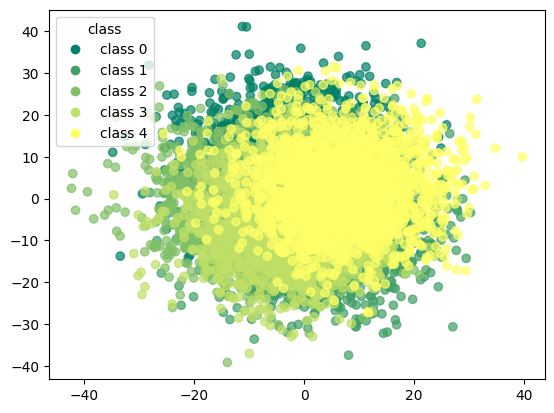

In [242]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

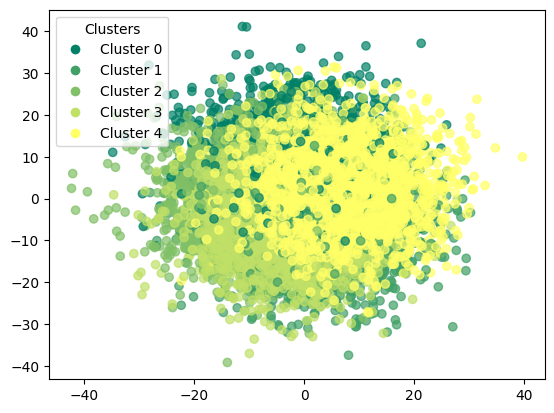

In [243]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [244]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1851    5   30   27   87]
 [   4 1715  110  127   44]
 [  28   80 1823   14   55]
 [  25  137   25 1786   27]
 [ 108   71   34   21 1766]]


In [245]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.92      0.93      0.92      2000
           1       0.85      0.86      0.86      2000
           2       0.90      0.91      0.91      2000
           3       0.90      0.89      0.90      2000
           4       0.89      0.88      0.89      2000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



## pam

In [246]:
initial_medoids = np.random.choice(len(X_values),5,replace=False)

In [247]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [248]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [249]:
pam.process()

In [250]:
clusters = pam.get_clusters()

In [251]:
medoids = pam.get_medoids()

In [252]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [253]:
df_pam = corr_dataset.copy()

In [254]:
df_pam['pam'] = labels

In [255]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,3.0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0.0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0.0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,3.0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,0.0
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,0.0
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,0.0
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,1.0


In [256]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.2625
accuracy after: 0.7119


In [257]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,4
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,4
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,1


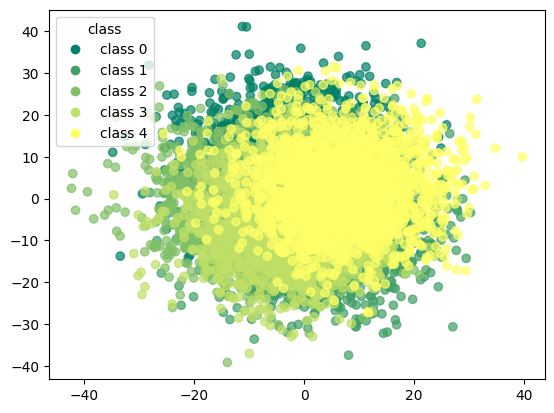

In [258]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

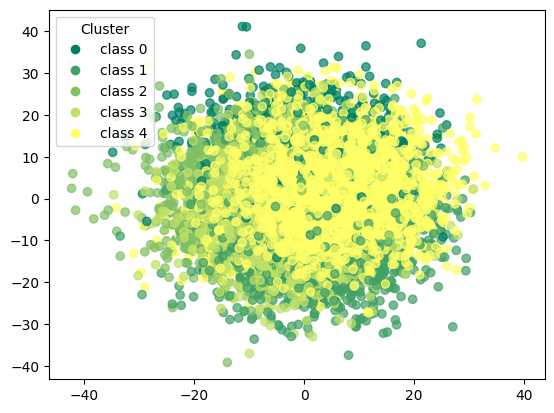

In [259]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [260]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1105   11   23    8  853]
 [   5 1672   86   57  180]
 [  38  216 1413    0  333]
 [  63  496   37 1170  234]
 [  81   96   37   27 1759]]


In [261]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.86      0.55      0.67      2000
           1       0.67      0.84      0.74      2000
           2       0.89      0.71      0.79      2000
           3       0.93      0.58      0.72      2000
           4       0.52      0.88      0.66      2000

    accuracy                           0.71     10000
   macro avg       0.77      0.71      0.72     10000
weighted avg       0.77      0.71      0.72     10000



### pam with pca

In [262]:
initial_medoids = np.random.choice(len(X_pca),5,replace=False)

In [263]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [264]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [265]:
pam_pca.process()

In [266]:
clusters = pam_pca.get_clusters()

In [267]:
medoids = pam_pca.get_medoids()

In [268]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [269]:
df_pam_pca = corr_dataset.copy()

In [270]:
df_pam_pca['pam_pca'] = labels

In [271]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,3.0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,3.0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,3.0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,3.0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4.0
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4.0
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4.0
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4.0


In [272]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.2069
accuracy after: 0.9104


In [273]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


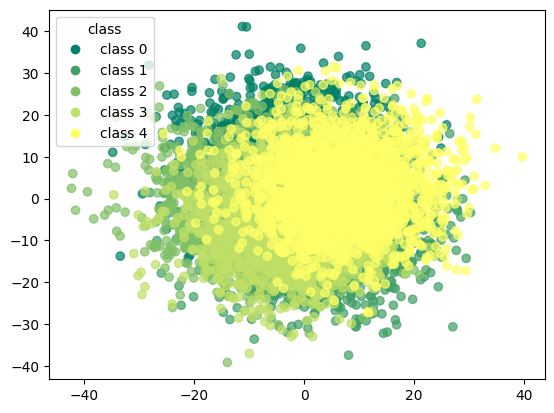

In [274]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

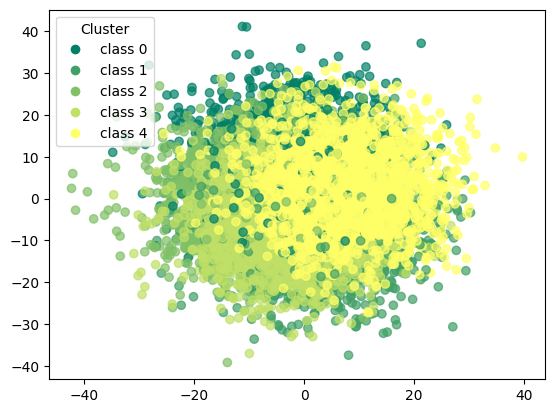

In [275]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [276]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1850    8   20   22  100]
 [   7 1752   76  124   41]
 [  30   82 1837   16   35]
 [  20  100   12 1842   26]
 [  67   61   31   18 1823]]


In [277]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.94      0.93      0.93      2000
           1       0.87      0.88      0.88      2000
           2       0.93      0.92      0.92      2000
           3       0.91      0.92      0.92      2000
           4       0.90      0.91      0.91      2000

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



### pam with t-SNE

In [278]:
initial_medoids = np.random.choice(len(X_pca),5,replace=False)

In [279]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [280]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [281]:
pam_tsne.process()

In [282]:
clusters = pam_tsne.get_clusters()

In [283]:
medoids = pam_tsne.get_medoids()

In [284]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [285]:
df_pam_tsne = corr_dataset.copy()

In [286]:
df_pam_tsne['pam_tsne'] = labels

In [287]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2.0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2.0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2.0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2.0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,0.0
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,3.0
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,0.0
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,0.0


In [288]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.1349
accuracy after: 0.6378


In [289]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,2
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,1
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,2
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,2


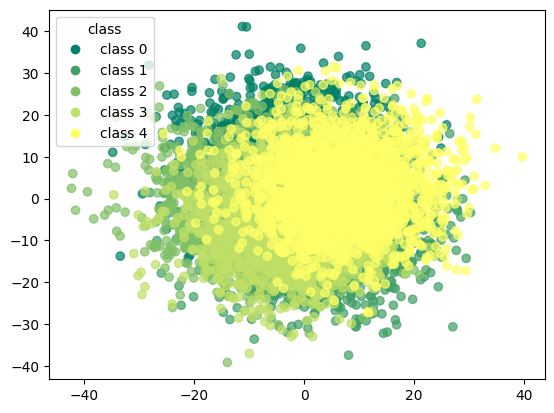

In [290]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

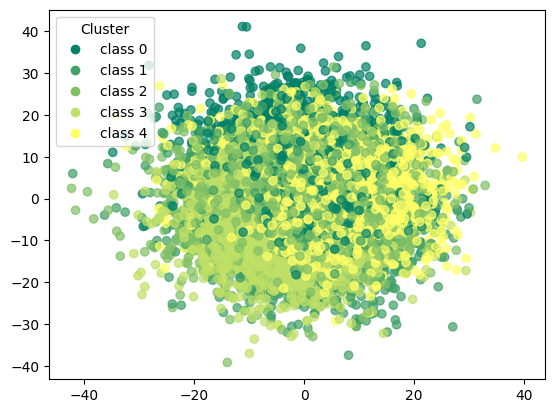

In [291]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [292]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1763   40   54   13  130]
 [   6 1256  144  380  214]
 [  23  496  816   31  634]
 [  26   64  127 1715   68]
 [ 289  118  748   17  828]]


In [293]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      2000
           1       0.64      0.63      0.63      2000
           2       0.43      0.41      0.42      2000
           3       0.80      0.86      0.83      2000
           4       0.44      0.41      0.43      2000

    accuracy                           0.64     10000
   macro avg       0.63      0.64      0.63     10000
weighted avg       0.63      0.64      0.63     10000



### pam with umap

In [294]:
initial_medoids = np.random.choice(len(X_pca),5,replace=False)

In [295]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [296]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [297]:
pam_umap.process()

In [298]:
clusters = pam_umap.get_clusters()

In [299]:
medoids = pam_umap.get_medoids()

In [300]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [301]:
df_pam_umap = corr_dataset.copy()

In [302]:
df_pam_umap['pam_umap'] = labels

In [303]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,2.0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,2.0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,2.0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,2.0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4.0
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4.0
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4.0
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4.0


In [304]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.2077
accuracy after: 0.8931


In [305]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,12.705664,6.748294,-5.873030,-10.584953,-10.781416,-21.169704,-4.946949,9.023408,2.023250,-1.236229,...,8.678142,-4.030266,-10.369664,-18.724477,1.279439,-5.258444,-0.342479,-1.732103,0,0
1,-3.082046,4.048290,10.426280,6.756491,-5.391693,-9.189364,-2.646822,0.792675,3.684449,5.200151,...,2.949868,4.175777,0.764133,-17.587756,-0.997952,4.677655,8.407650,5.217106,0,0
2,-2.319986,2.866214,1.010373,4.889372,-6.440553,-1.972106,-0.089756,9.448384,2.404697,-1.954377,...,4.935198,-14.384271,0.450465,-12.496637,-5.436116,-2.989479,13.260827,10.137276,0,0
3,3.529845,7.539913,8.107279,2.319965,0.473008,0.165447,-1.418736,11.139554,4.911513,12.928913,...,-4.187658,-5.957211,-9.844361,-5.785951,-3.891932,-1.629284,4.755421,-5.504502,0,0
4,5.793794,6.078907,-1.176956,1.680281,-10.933520,1.667168,-2.071790,18.884459,-7.605230,-10.676701,...,13.632486,0.511911,-5.944074,-8.586266,-13.283501,11.592163,5.192202,20.547879,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-11.798745,-11.868768,-1.700667,-28.298830,-5.414981,-6.301504,2.458602,0.150721,9.251233,1.117732,...,3.575000,6.248812,-4.605458,-15.655615,13.490459,13.922799,-22.736367,-6.916849,4,4
9996,5.086305,8.943397,4.933019,-16.902235,0.908534,-2.028999,2.009960,-10.335347,16.734065,-7.729706,...,12.177736,16.580166,-7.286208,-10.656248,-14.384272,-5.745800,-26.077213,-1.108602,4,4
9997,-2.301769,-9.833055,0.200556,-16.075640,3.246260,-3.921570,-6.731092,1.579050,3.096432,-5.922517,...,5.729038,8.746567,13.845319,-13.122158,10.158371,-4.899604,-13.724901,-16.671214,4,4
9998,1.115991,-8.703741,-2.245098,-7.702169,-1.023522,5.298187,4.158074,-13.897185,6.199786,-9.037374,...,-6.246344,11.826186,12.484092,14.433940,-8.556646,1.782832,-25.276696,-14.263087,4,4


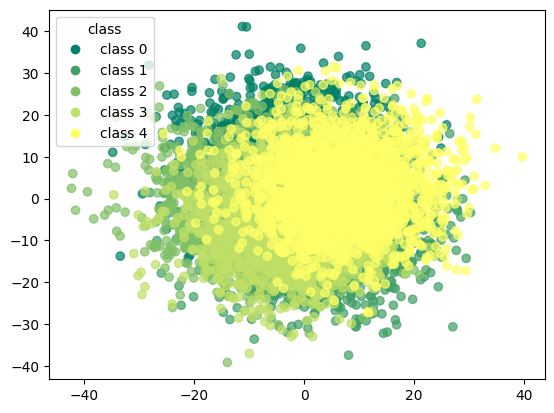

In [306]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

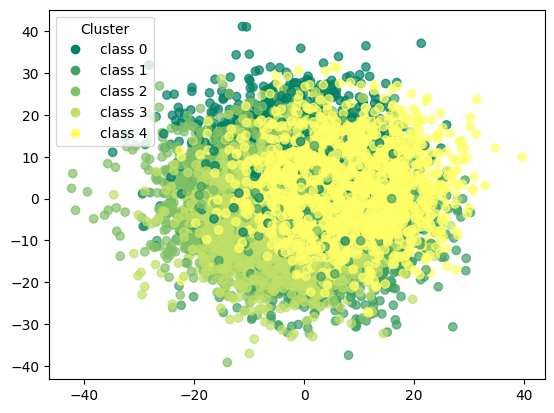

In [307]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [308]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1827    6   29   26  112]
 [   4 1732  110  112   42]
 [  28   79 1826   14   53]
 [  25  142   26 1780   27]
 [  93   81   38   22 1766]]


In [309]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.92      0.91      0.92      2000
           1       0.85      0.87      0.86      2000
           2       0.90      0.91      0.91      2000
           3       0.91      0.89      0.90      2000
           4       0.88      0.88      0.88      2000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



# overall results k-means

## basic

In [310]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.94      0.93      0.94      2000
           1       0.89      0.89      0.89      2000
           2       0.93      0.93      0.93      2000
           3       0.91      0.93      0.92      2000
           4       0.91      0.92      0.91      2000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



In [311]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1867    4   25   24   80]
 [   7 1770   73  112   38]
 [  22   69 1852   16   41]
 [  20   95   15 1852   18]
 [  72   49   27   21 1831]]


## + pca

In [312]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.94      0.93      0.93      2000
           1       0.88      0.88      0.88      2000
           2       0.92      0.92      0.92      2000
           3       0.91      0.92      0.91      2000
           4       0.91      0.91      0.91      2000

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



In [313]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1863    4   27   24   82]
 [   7 1752   83  118   40]
 [  23   76 1847   13   41]
 [  20  110   17 1833   20]
 [  79   55   31   24 1811]]


## + t-SNE

In [314]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.81      0.91      0.86      2000
           1       0.63      0.62      0.62      2000
           2       0.41      0.39      0.40      2000
           3       0.81      0.86      0.83      2000
           4       0.39      0.34      0.36      2000

    accuracy                           0.62     10000
   macro avg       0.61      0.62      0.62     10000
weighted avg       0.61      0.62      0.62     10000



In [315]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1821   41   73   12   53]
 [   6 1239  112  346  297]
 [  25  513  787   30  645]
 [  25   70  111 1716   78]
 [ 376  116  817   15  676]]


## + UMAP

In [316]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      2000
           1       0.85      0.86      0.86      2000
           2       0.90      0.91      0.91      2000
           3       0.90      0.90      0.90      2000
           4       0.88      0.88      0.88      2000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



In [317]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[1830    5   29   27  109]
 [   4 1718  109  127   42]
 [  28   78 1826   15   53]
 [  25  134   24 1790   27]
 [  94   81   38   22 1765]]


# overall results trimmed k-means

## basic

In [318]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1803
           1       0.89      0.88      0.89      1797
           2       0.93      0.93      0.93      1804
           3       0.92      0.93      0.92      1789
           4       0.92      0.92      0.92      1807

    accuracy                           0.92      9000
   macro avg       0.92      0.92      0.92      9000
weighted avg       0.92      0.92      0.92      9000



In [319]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1686    3   22   20   72]
 [   6 1590   71   99   31]
 [  17   62 1683   12   30]
 [  17   81   14 1661   16]
 [  67   43   25   14 1658]]


## + pca

In [320]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1803
           1       0.87      0.88      0.87      1797
           2       0.92      0.92      0.92      1804
           3       0.91      0.92      0.92      1789
           4       0.91      0.91      0.91      1807

    accuracy                           0.91      9000
   macro avg       0.91      0.91      0.91      9000
weighted avg       0.91      0.91      0.91      9000



In [321]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1687    8   22   18   68]
 [   5 1573   80  105   34]
 [  20   71 1665   11   37]
 [  16  100   17 1641   15]
 [  71   49   23   21 1643]]


## + t-SNE

In [322]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.82      0.92      0.87      1803
           1       0.65      0.64      0.65      1797
           2       0.42      0.40      0.41      1804
           3       0.81      0.86      0.84      1789
           4       0.40      0.35      0.37      1807

    accuracy                           0.64      9000
   macro avg       0.62      0.64      0.63      9000
weighted avg       0.62      0.64      0.63      9000



In [323]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[1667   35   45   15   41]
 [   3 1158  102  289  245]
 [  19  458  719   22  586]
 [  19   54   96 1544   76]
 [ 324   75  744   34  630]]


## + UMAP

In [324]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1861
           1       0.91      0.90      0.91      1756
           2       0.94      0.95      0.95      1824
           3       0.94      0.94      0.94      1821
           4       0.93      0.93      0.93      1738

    accuracy                           0.94      9000
   macro avg       0.94      0.93      0.93      9000
weighted avg       0.94      0.94      0.94      9000



In [325]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[1770    3   13   15   60]
 [   2 1582   63   87   22]
 [  18   44 1736    5   21]
 [  16   79    8 1707   11]
 [  58   30   18    9 1623]]


# overall results dbscan

## basic

In [326]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    2000.0
           1       0.00      0.00      0.00    2000.0
           2       0.00      0.00      0.00    2000.0
           3       0.00      0.00      0.00    2000.0
           4       0.00      0.00      0.00    2000.0

    accuracy                           0.00   10000.0
   macro avg       0.00      0.00      0.00   10000.0
weighted avg       0.00      0.00      0.00   10000.0



In [327]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]]


## + pca

In [328]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.00      0.01      2000
           1       0.00      0.00      0.00      2000
           2       0.61      0.01      0.02      2000
           3       0.00      0.00      0.00      2000
           4       0.00      0.00      0.00      2000
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

In [329]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0 ...    0    0    0]
 [1601    8   23 ...    0    0    4]
 [1638    0    0 ...    0    0    0]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]


## + t-SNE

In [330]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    2000.0
           1       0.00      0.00      0.00    2000.0
           2       0.00      0.00      0.00    2000.0
           3       0.00      0.00      0.00    2000.0
           4       0.00      0.00      0.00    2000.0

    accuracy                           0.00   10000.0
   macro avg       0.00      0.00      0.00   10000.0
weighted avg       0.00      0.00      0.00   10000.0



In [331]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]
 [2000    0    0    0    0    0]]


## + UMAP

In [332]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      2000
           1       0.00      0.00      0.00      2000
           2       0.00      0.00      0.00      2000
           3       0.00      0.00      0.00      2000
           4       0.20      1.00      0.33      2000

    accuracy                           0.20     10000
   macro avg       0.03      0.17      0.06     10000
weighted avg       0.04      0.20      0.07     10000



In [333]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[   0    0    0    0    0    0]
 [   0    0    0    0    0 2000]
 [   0    0    0    0    0 2000]
 [   0    0    0    0    0 2000]
 [   1    0    0    0    0 1999]
 [   0    0    0    0    0 2000]]


# overall results GMM

## basic

In [334]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.47      0.94      0.62      2000
           1       0.91      0.76      0.83      2000
           2       0.03      0.01      0.02      2000
           3       0.93      0.75      0.83      2000
           4       0.90      0.90      0.90      2000

    accuracy                           0.67     10000
   macro avg       0.65      0.67      0.64     10000
weighted avg       0.65      0.67      0.64     10000



In [335]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1879    4    3   18   96]
 [  69 1524  289   78   40]
 [1873   66   24    6   31]
 [  55   50  378 1492   25]
 [ 149   36   12   11 1792]]


## + pca

In [336]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      2000
           1       0.89      0.85      0.87      2000
           2       0.90      0.94      0.92      2000
           3       0.89      0.93      0.91      2000
           4       0.92      0.89      0.91      2000

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



In [337]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1863    2   36   31   68]
 [   5 1706  103  148   38]
 [  20   66 1872   14   28]
 [  19   82   21 1863   15]
 [  87   57   51   28 1777]]


## + t-SNE

In [338]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.59      0.39      0.47      2000
           1       0.32      0.37      0.34      2000
           2       0.29      0.46      0.35      2000
           3       0.85      0.41      0.55      2000
           4       0.43      0.46      0.44      2000

    accuracy                           0.42     10000
   macro avg       0.49      0.42      0.43     10000
weighted avg       0.49      0.42      0.43     10000



In [339]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[ 788  617   22    3  570]
 [  15  749 1064  111   61]
 [  20  535  914   17  514]
 [  17   38 1051  813   81]
 [ 506  419  151   10  914]]


## + UMAP

In [340]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.92      0.93      0.92      2000
           1       0.85      0.86      0.86      2000
           2       0.90      0.91      0.91      2000
           3       0.90      0.89      0.90      2000
           4       0.89      0.88      0.89      2000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



In [341]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1851    5   30   27   87]
 [   4 1715  110  127   44]
 [  28   80 1823   14   55]
 [  25  137   25 1786   27]
 [ 108   71   34   21 1766]]


# overall results pam

## basic

In [342]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1105   11   23    8  853]
 [   5 1672   86   57  180]
 [  38  216 1413    0  333]
 [  63  496   37 1170  234]
 [  81   96   37   27 1759]]


In [343]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.86      0.55      0.67      2000
           1       0.67      0.84      0.74      2000
           2       0.89      0.71      0.79      2000
           3       0.93      0.58      0.72      2000
           4       0.52      0.88      0.66      2000

    accuracy                           0.71     10000
   macro avg       0.77      0.71      0.72     10000
weighted avg       0.77      0.71      0.72     10000



## + pca

In [344]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1850    8   20   22  100]
 [   7 1752   76  124   41]
 [  30   82 1837   16   35]
 [  20  100   12 1842   26]
 [  67   61   31   18 1823]]


In [345]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.94      0.93      0.93      2000
           1       0.87      0.88      0.88      2000
           2       0.93      0.92      0.92      2000
           3       0.91      0.92      0.92      2000
           4       0.90      0.91      0.91      2000

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



## + t-SNE

In [346]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1763   40   54   13  130]
 [   6 1256  144  380  214]
 [  23  496  816   31  634]
 [  26   64  127 1715   68]
 [ 289  118  748   17  828]]


In [347]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      2000
           1       0.64      0.63      0.63      2000
           2       0.43      0.41      0.42      2000
           3       0.80      0.86      0.83      2000
           4       0.44      0.41      0.43      2000

    accuracy                           0.64     10000
   macro avg       0.63      0.64      0.63     10000
weighted avg       0.63      0.64      0.63     10000



## + umap

In [348]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1827    6   29   26  112]
 [   4 1732  110  112   42]
 [  28   79 1826   14   53]
 [  25  142   26 1780   27]
 [  93   81   38   22 1766]]


In [349]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.92      0.91      0.92      2000
           1       0.85      0.87      0.86      2000
           2       0.90      0.91      0.91      2000
           3       0.91      0.89      0.90      2000
           4       0.88      0.88      0.88      2000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000

